Defining UNET structure


In [80]:
import tensorflow as tf
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model,save_model
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.models import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.layers import(
    Input,
    Activation,
    BatchNormalization,
    Dropout,
    Lambda,
    Conv2D,
    Conv2DTranspose,
    MaxPooling2D,
    concatenate,
)
from tensorflow.keras import backend as K


def unet(pretrained_weights = None,input_size = (256,256,1)):
    inputs = Input(input_size)

    # Contracting Path
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    # Expansive part
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

    model = Model(inputs,conv10)

    model.compile(optimizer = Adam(lr = 1e-4), loss = 'binary_crossentropy', metrics = ['accuracy'])

    model.summary()

    if(pretrained_weights):
    	model.load_weights(pretrained_weights)

    return model

Import Required libraries

In [79]:
from __future__ import print_function
from keras.preprocessing.image import ImageDataGenerator #for data augmentation during training
import numpy as np
import os   #navigating directories and working with file paths
import glob  #for finding all the pathnames matching a specified pattern
import skimage.io as io #reading and saving images
import skimage.transform as trans #provides functions for image transformation


Color dictionary

In [82]:
Sky = [128,128,128]
Building = [128,0,0]
Pole = [192,192,128]
Road = [128,64,128]
Pavement = [60,40,222]
Tree = [128,128,0]
SignSymbol = [192,128,128]
Fence = [64,64,128]
Car = [64,0,128]
Pedestrian = [64,64,0]
Bicyclist = [0,128,192]
Unlabelled = [0,0,0]

COLOR_DICT = np.array([Sky, Building, Pole, Road, Pavement,
                          Tree, SignSymbol, Fence, Car, Pedestrian, Bicyclist, Unlabelled])

  Adjust image and mask data for training.

  

In [ ]:
def adjustData(img,mask,flag_multi_class,num_class):
    if(flag_multi_class):
        img = img / 255
        mask = mask[:,:,:,0] if(len(mask.shape) == 4) else mask[:,:,0]
        new_mask = np.zeros(mask.shape + (num_class,))
        for i in range(num_class):
            new_mask[mask == i,i] = 1
        new_mask = np.reshape(new_mask,(new_mask.shape[0],new_mask.shape[1]*new_mask.shape[2],new_mask.shape[3])) if flag_multi_class else np.reshape(new_mask,(new_mask.shape[0]*new_mask.shape[1],new_mask.shape[2]))
        mask = new_mask   #Normalization and one-hot encoding for multi-class segmentation.
    elif(np.max(img) > 1): #Binary thresholding for binary segmentation
        img = img / 255
        mask = mask /255
        mask[mask > 0.5] = 1
        mask[mask <= 0.5] = 0
    return (img,mask)

In [78]:
def trainGenerator(batch_size,train_path,image_folder,mask_folder,aug_dict,image_color_mode = "grayscale",
                    mask_color_mode = "grayscale",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (256,256),seed = 1):
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    image_generator = image_datagen.flow_from_directory(
        train_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        train_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    train_generator = zip(image_generator, mask_generator)  # Combine image and mask generators into a single generator using zip
    for (img,mask) in train_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class) # Iterate through the combined generator and adjust data using the adjustData function
        yield (img,mask)  # Yield the adjusted image and mask as a batch


Generate batches of processed images for testing

In [ ]:
def testGenerator(test_path,num_image = 30,target_size = (256,256),flag_multi_class = False,as_gray = True):
    for i in range(num_image):
        img = io.imread(os.path.join(test_path,"%d.png"%i),as_gray = as_gray) #Read image
        img = img / 255  #normalize pixel value between zero and one
        img = trans.resize(img,target_size)  #resize to target_size
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img  # Add a singleton dimension if flag_multi_class is False
        img = np.reshape(img,(1,)+img.shape)  # Add a batch dimension
        yield img

Generating and preparing training data from a set of images and their corresponding masks.

In [81]:
def geneTrainNpy(image_path,mask_path,flag_multi_class = False,num_class = 2,image_prefix = "image",mask_prefix = "mask",image_as_gray = True,mask_as_gray = True):
    image_name_arr = glob.glob(os.path.join(image_path,"%s*.png"%image_prefix))  # Get a list of file paths for images in the specified directory with the given prefix
    image_arr = []  #Initialize empty lists to store images and masks
    mask_arr = []
    for index,item in enumerate(image_name_arr):  # Iterate over each image file
        img = io.imread(item,as_gray = image_as_gray) # Read the image from the file, considering whether it should be read as grayscale
        img = np.reshape(img,img.shape + (1,)) if image_as_gray else img  # Add a singleton dimension if the image is grayscale
        mask = io.imread(item.replace(image_path,mask_path).replace(image_prefix,mask_prefix),as_gray = mask_as_gray)  # Read the corresponding mask, considering whether it should be read as grayscale
        mask = np.reshape(mask,mask.shape + (1,)) if mask_as_gray else mask # Add a singleton dimension if the mask is grayscale
        img,mask = adjustData(img,mask,flag_multi_class,num_class)# Adjust the data (normalize, one-hot encode if needed)
        image_arr.append(img) # Append the adjusted image and mask to the lists
        mask_arr.append(mask)
    image_arr = np.array(image_arr) # Convert the lists to NumPy arrays
    mask_arr = np.array(mask_arr)
    return image_arr,mask_arr


In [83]:
def labelVisualize(num_class,color_dict,img):
    img = img[:,:,0] if len(img.shape) == 3 else img # Check if the input image has a third dimension (indicating color)
    img_out = np.zeros(img.shape + (3,)) # Initialize an output array with an additional channel for RGB
    for i in range(num_class):
        img_out[img == i,:] = color_dict[i] # Assign the corresponding RGB color from color_dict to pixels where img equals the class index
    return img_out / 255

Saving Images produced by trained model

In [ ]:
def saveResult(save_path,npyfile,flag_multi_class = False,num_class = 2):
    for i,item in enumerate(npyfile):
        img = labelVisualize(num_class,COLOR_DICT,item) if flag_multi_class else item[:,:,0]
        io.imsave(os.path.join(save_path,"%d_predict.png"%i),img)

Un-zipping the dataset

In [ ]:
!unzip /content/data.zip

Archive:  /content/data.zip
   creating: data/
  inflating: __MACOSX/._data         
  inflating: data/.DS_Store          
  inflating: __MACOSX/data/._.DS_Store  
  inflating: data/image_arr.npy      
  inflating: data/mask_arr.npy       
   creating: data/membrane/
  inflating: __MACOSX/data/._membrane  
  inflating: data/membrane/.DS_Store  
  inflating: __MACOSX/data/membrane/._.DS_Store  
   creating: data/membrane/test/
  inflating: __MACOSX/data/membrane/._test  
  inflating: data/membrane/test-volume.tif  
  inflating: __MACOSX/data/membrane/._test-volume.tif  
  inflating: data/membrane/train-volume.tif  
  inflating: __MACOSX/data/membrane/._train-volume.tif  
  inflating: data/membrane/train-labels.tif  
  inflating: __MACOSX/data/membrane/._train-labels.tif  
   creating: data/membrane/train/
  inflating: __MACOSX/data/membrane/._train  
  inflating: data/membrane/test/.DS_Store  
  inflating: __MACOSX/data/membrane/test/._.DS_Store  
  inflating: data/membrane/test/8.png  

Generates Augmented images

In [ ]:
data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest')
myGenerator = trainGenerator(20,'data/membrane/train','image','label',data_gen_args,save_to_dir = "data/membrane/train/aug")
num_batch = 3
for i,batch in enumerate(myGenerator):
    if(i >= num_batch):
        break

Found 30 images belonging to 1 classes.
Found 30 images belonging to 1 classes.


 Loads and processes a set of augmented images

In [ ]:
image_arr,mask_arr = geneTrainNpy("data/membrane/train/aug/","data/membrane/train/aug/")

In [ ]:
myGene = trainGenerator(2,'data/membrane/train','image','label',data_gen_args,save_to_dir = None)

Training model

In [ ]:
model = unet()
model_checkpoint = ModelCheckpoint('unet_membrane.hdf5', monitor='loss',verbose=1, save_best_only=True)
model.fit(myGene,steps_per_epoch=2000,epochs=5,callbacks=[model_checkpoint])

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_155 (Conv2D)         (None, 256, 256, 64)         640       ['input_8[0][0]']             
                                                                                                  
 conv2d_156 (Conv2D)         (None, 256, 256, 64)         36928     ['conv2d_155[0][0]']          
                                                                                                  
 max_pooling2d_28 (MaxPooli  (None, 128, 128, 64)         0         ['conv2d_156[0][0]']          
 ng2D)                                                                                      

Training with augmented data

In [ ]:
imgs_train,imgs_mask_train = geneTrainNpy("data/membrane/train/aug/","data/membrane/train/aug/")
model.fit(imgs_train, imgs_mask_train, batch_size=2, epochs=10, verbose=1,validation_split=0.2, shuffle=True, callbacks= [model_checkpoint])

Epoch 1/10
24/24 [==============================] - ETA: 0s - loss: 0.0804 - accuracy: 0.9649
Epoch 1: loss did not improve from 0.07915
24/24 [==============================] - 6s 226ms/step - loss: 0.0804 - accuracy: 0.9649 - val_loss: 0.0750 - val_accuracy: 0.9672
Epoch 2/10
24/24 [==============================] - ETA: 0s - loss: 0.0677 - accuracy: 0.9709
Epoch 2: loss improved from 0.07915 to 0.06769, saving model to unet_membrane.hdf5
24/24 [==============================] - 6s 267ms/step - loss: 0.0677 - accuracy: 0.9709 - val_loss: 0.0759 - val_accuracy: 0.9675
Epoch 3/10
24/24 [==============================] - ETA: 0s - loss: 0.0597 - accuracy: 0.9746
Epoch 3: loss improved from 0.06769 to 0.05972, saving model to unet_membrane.hdf5
24/24 [==============================] - 6s 258ms/step - loss: 0.0597 - accuracy: 0.9746 - val_loss: 0.0781 - val_accuracy: 0.9674
Epoch 4/10
24/24 [==============================] - ETA: 0s - loss: 0.0556 - accuracy: 0.9766
Epoch 4: loss improved

In [ ]:
testGene = testGenerator("data/membrane/test")
model = unet()
model.load_weights("unet_membrane.hdf5")
results = model.predict(testGene, 30, verbose=1)
saveResult("data/membrane/test", results)

def saveResult(save_path, npyfile, flag_multi_class=False, num_class=2):
    for i, item in enumerate(npyfile):
        # Convert the floating-point image to integer and scale to 0-255
        img = labelVisualize(num_class, COLOR_DICT, item) if flag_multi_class else item[:, :, 0]
        img = (img * 255).astype(np.uint8)

        # Save the image
        io.imsave(os.path.join(save_path, f"{i}_predict.png"), img)

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_13 (InputLayer)       [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_275 (Conv2D)         (None, 256, 256, 64)         640       ['input_13[0][0]']            
                                                                                                  
 conv2d_276 (Conv2D)         (None, 256, 256, 64)         36928     ['conv2d_275[0][0]']          
                                                                                                  
 max_pooling2d_48 (MaxPooli  (None, 128, 128, 64)         0         ['conv2d_276[0][0]']          
 ng2D)                                                                                     

Downloading the new dataset folder after changes

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Downloading File


In [ ]:
%cd /content

/content


In [ ]:
!zip -r dataset.zip data/

  adding: data/ (stored 0%)
  adding: data/membrane/ (stored 0%)
  adding: data/membrane/train/ (stored 0%)
  adding: data/membrane/train/label/ (stored 0%)
  adding: data/membrane/train/label/19.png (stored 0%)
  adding: data/membrane/train/label/3.png (stored 0%)
  adding: data/membrane/train/label/2.png (stored 0%)
  adding: data/membrane/train/label/5.png (stored 0%)
  adding: data/membrane/train/label/11.png (stored 0%)
  adding: data/membrane/train/label/14.png (stored 0%)
  adding: data/membrane/train/label/16.png (stored 0%)
  adding: data/membrane/train/label/7.png (stored 0%)
  adding: data/membrane/train/label/10.png (stored 0%)
  adding: data/membrane/train/label/17.png (stored 0%)
  adding: data/membrane/train/label/8.png (stored 0%)
  adding: data/membrane/train/label/23.png (stored 0%)
  adding: data/membrane/train/label/28.png (stored 0%)
  adding: data/membrane/train/label/13.png (stored 0%)
  adding: data/membrane/train/label/25.png (stored 0%)
  adding: data/membrane

Plotting the masked image of test data

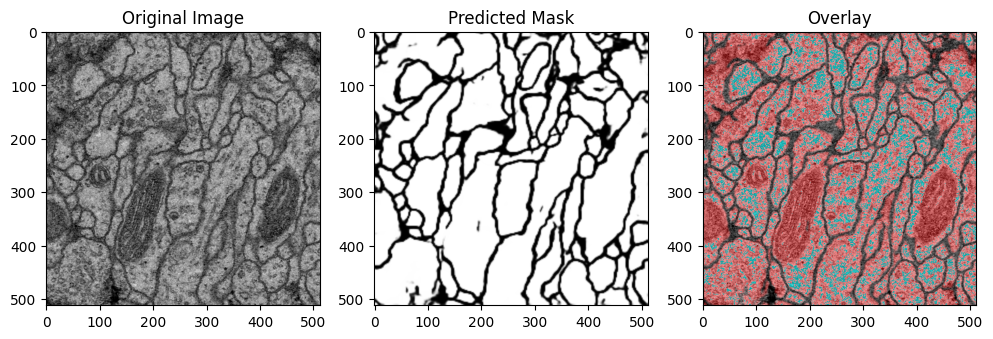

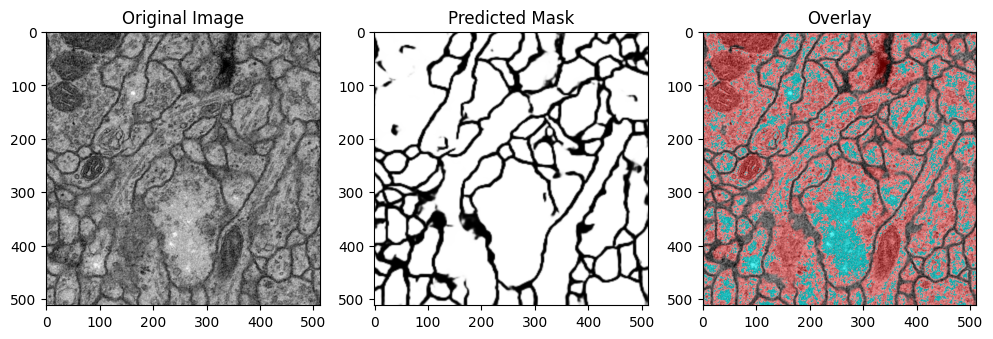

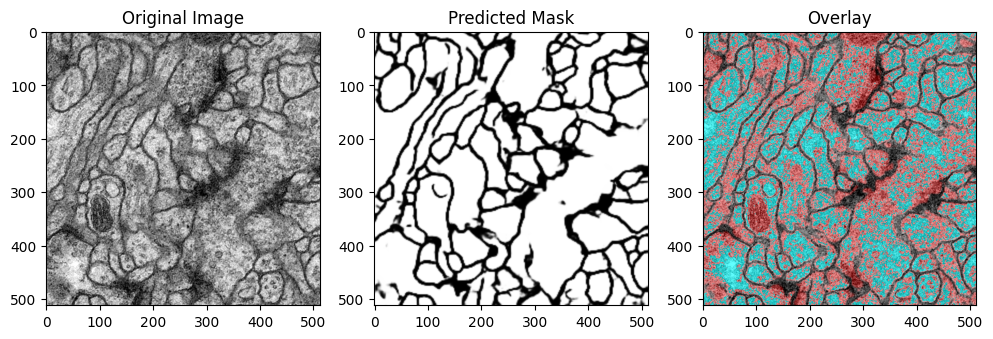

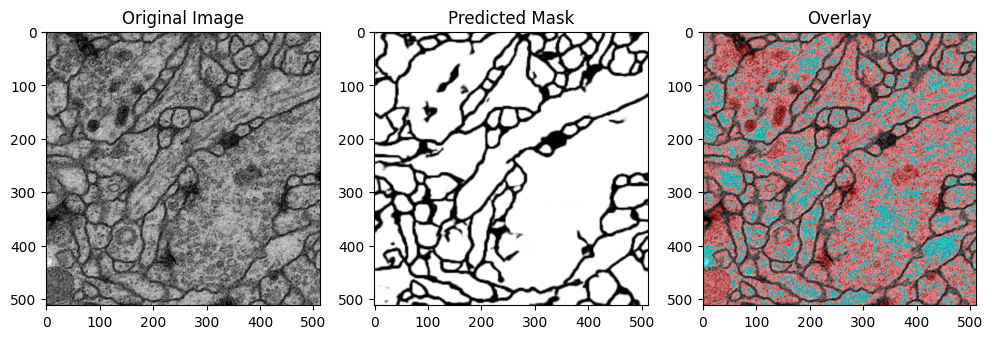

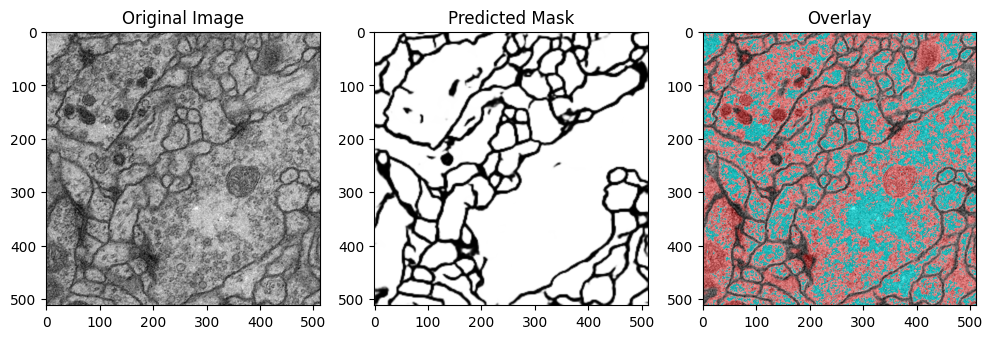

...

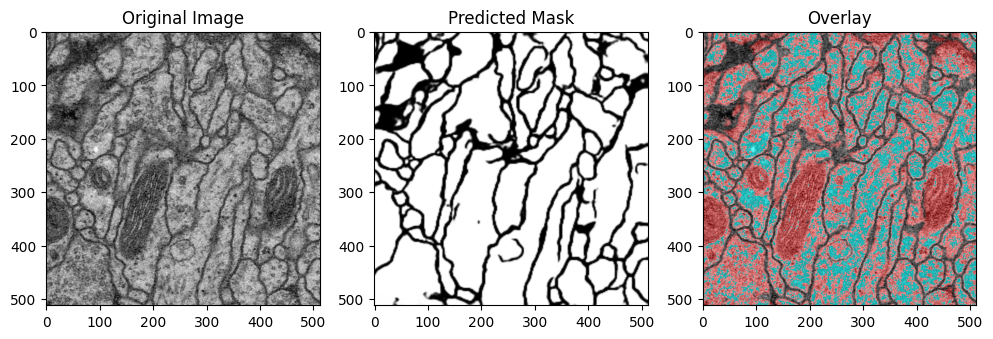

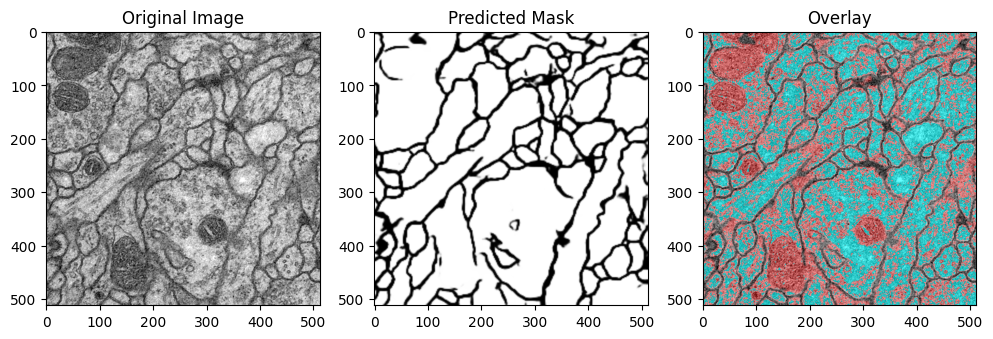

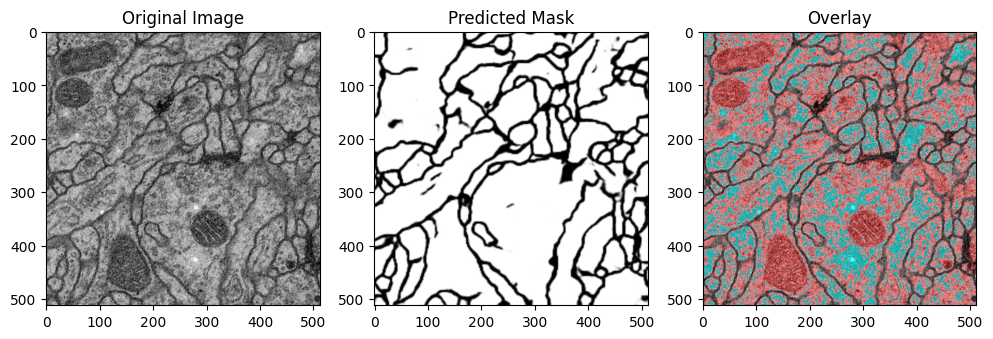

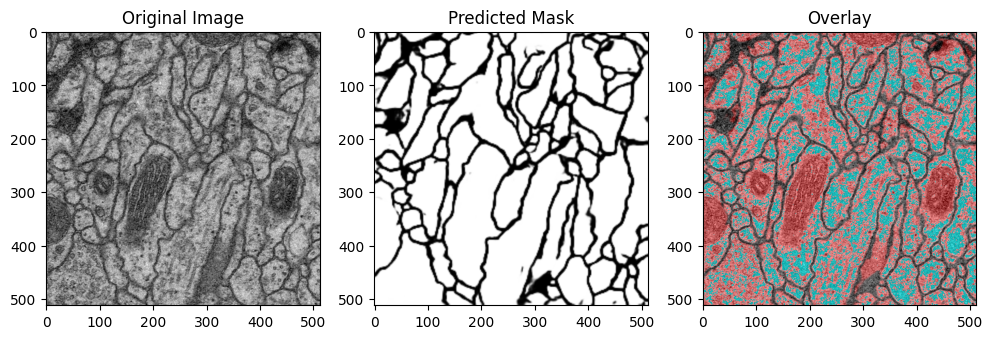

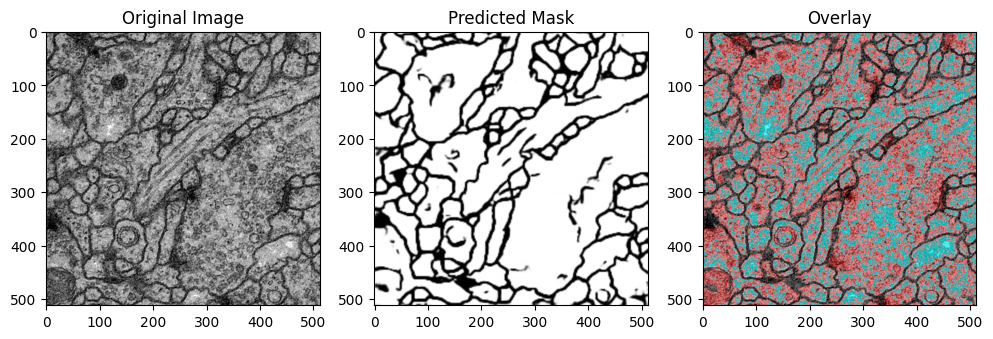

In [84]:
import matplotlib.pyplot as plt
from skimage import io, color, transform

# Directory where the predicted images are saved
results_dir = "data/membrane/test"

# Get the list of predicted image filenames
results_filenames = [filename for filename in os.listdir(results_dir) if filename.endswith("_predict.png")]

# Plot the original test images, corresponding predicted masks, and the overlay of original and predicted masks
for filename in results_filenames:
    # Load the original test image
    original_image = io.imread(os.path.join(results_dir, filename.replace("_predict.png", ".png")))

    # Load the predicted mask
    predicted_mask = io.imread(os.path.join(results_dir, filename), as_gray=True)

    # Resize the predicted mask to match the original image size
    predicted_mask = transform.resize(predicted_mask, original_image.shape[:2], anti_aliasing=True)

    # Convert the original image to RGB if it is grayscale
    if original_image.ndim == 2:
        original_image = color.gray2rgb(original_image)

    # Plot the original test image
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')

    # Plot the predicted mask
    plt.subplot(1, 3, 2)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title('Predicted Mask')

    # Overlay original image with predicted mask
    overlay = original_image.copy()
    overlay[:, :, 0] += (predicted_mask * 100).astype(np.uint8)  # Adjust transparency on the red channel
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title('Overlay')

    plt.show()
